In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
df = pd.read_csv("train.csv")
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [4]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

<AxesSubplot:>

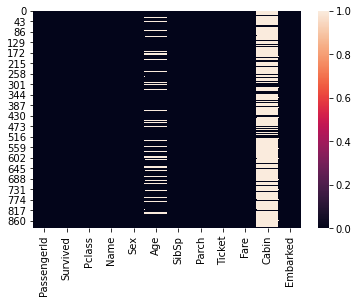

In [5]:
sns.heatmap(df.isnull())

# Handling null values

In [6]:
# Now that the Cabin feature has so many null values. Let us drop it as it will be of no good to our model.
df = df.drop('Cabin', axis = 1)
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S
...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C


29.69911764705882


<AxesSubplot:>

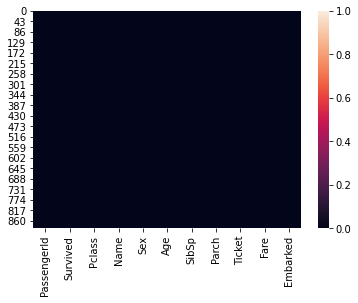

In [7]:
#Filled age null values with the mean age
print(df['Age'].mean())
df.fillna({'Age': df['Age'].mean()}, inplace = True)
sns.heatmap(df.isnull())

In [8]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S


# One Hot Encoding

In [9]:
# Convert Sex categorical data into different dummy columns
dummies = pd.get_dummies(df.Sex)
dummies.drop('male', axis = 1, inplace = True)
dummies


,female
0,0
1,1
2,1
3,1
4,0
...,...
886,0
887,1
888,1
889,0


In [10]:
df = pd.concat([df.drop('Sex', axis = 1), dummies], axis = 'columns')
df

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Embarked,female
0,1,0,3,"Braund, Mr. Owen Harris",22.000000,1,0,A/5 21171,7.2500,S,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.000000,1,0,PC 17599,71.2833,C,1
2,3,1,3,"Heikkinen, Miss. Laina",26.000000,0,0,STON/O2. 3101282,7.9250,S,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.000000,1,0,113803,53.1000,S,1
4,5,0,3,"Allen, Mr. William Henry",35.000000,0,0,373450,8.0500,S,0
...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",27.000000,0,0,211536,13.0000,S,0
887,888,1,1,"Graham, Miss. Margaret Edith",19.000000,0,0,112053,30.0000,S,1
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",29.699118,1,2,W./C. 6607,23.4500,S,1
889,890,1,1,"Behr, Mr. Karl Howell",26.000000,0,0,111369,30.0000,C,0


In [11]:
# One hot encoding for Embarked field
dummies = pd.get_dummies(df.Embarked)
dummies.drop('C', axis = 1, inplace = True)
dummies

,Q,S
0,0,1
1,0,0
2,0,1
3,0,1
4,0,1
...,...,...
886,0,1
887,0,1
888,0,1
889,0,0


In [12]:
df = pd.concat([df.drop('Embarked', axis = 1), dummies], axis = 'columns')
df

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,female,Q,S
0,1,0,3,"Braund, Mr. Owen Harris",22.000000,1,0,A/5 21171,7.2500,0,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.000000,1,0,PC 17599,71.2833,1,0,0
2,3,1,3,"Heikkinen, Miss. Laina",26.000000,0,0,STON/O2. 3101282,7.9250,1,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.000000,1,0,113803,53.1000,1,0,1
4,5,0,3,"Allen, Mr. William Henry",35.000000,0,0,373450,8.0500,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",27.000000,0,0,211536,13.0000,0,0,1
887,888,1,1,"Graham, Miss. Margaret Edith",19.000000,0,0,112053,30.0000,1,0,1
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",29.699118,1,2,W./C. 6607,23.4500,1,0,1
889,890,1,1,"Behr, Mr. Karl Howell",26.000000,0,0,111369,30.0000,0,0,0


In [13]:
df.drop(['Name', 'Ticket'], axis = 1, inplace = True)
df

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,female,Q,S
0,1,0,3,22.000000,1,0,7.2500,0,0,1
1,2,1,1,38.000000,1,0,71.2833,1,0,0
2,3,1,3,26.000000,0,0,7.9250,1,0,1
3,4,1,1,35.000000,1,0,53.1000,1,0,1
4,5,0,3,35.000000,0,0,8.0500,0,0,1
...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,27.000000,0,0,13.0000,0,0,1
887,888,1,1,19.000000,0,0,30.0000,1,0,1
888,889,0,3,29.699118,1,2,23.4500,1,0,1
889,890,1,1,26.000000,0,0,30.0000,0,0,0


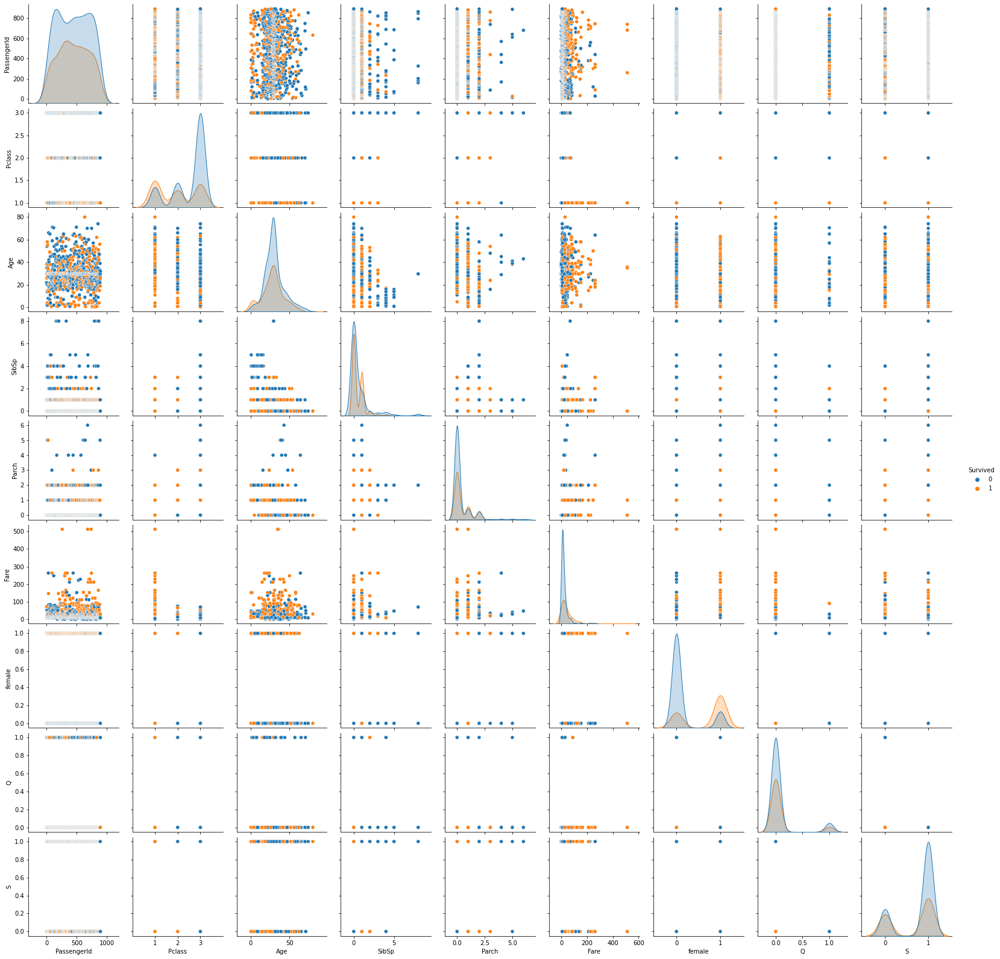

In [16]:
sns.pairplot(df, hue = 'Survived')

# Training and Testing

In [14]:
from sklearn.model_selection import train_test_split
X_t, X_test, y_t, y_test = train_test_split(df.drop('Survived', axis = 1), df.Survived, test_size = 0.3, random_state = 101)
X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size = 0.3, random_state = 101)

# Logistic Regression

In [15]:
from sklearn.linear_model import LogisticRegression
max_iter = 1000
titanic_model = LogisticRegression(max_iter = max_iter)
titanic_model.fit(X_train, y_train)
titanic_model_logistic_regression = titanic_model #Saving for later
pred_val = titanic_model.predict(X_val)

In [16]:
from sklearn.metrics import confusion_matrix, classification_report
print(classification_report(y_val, pred_val))
print(confusion_matrix(y_val, pred_val))

              precision    recall  f1-score   support

           0       0.85      0.82      0.83       127
           1       0.64      0.68      0.66        60

    accuracy                           0.78       187
   macro avg       0.74      0.75      0.75       187
weighted avg       0.78      0.78      0.78       187

[[104  23]
 [ 19  41]]


In [17]:
titanic_model.fit(X_train, y_train)
print(classification_report(y_train, titanic_model.predict(X_train)))
print(confusion_matrix(y_train, titanic_model.predict(X_train)))

              precision    recall  f1-score   support

           0       0.84      0.89      0.87       268
           1       0.81      0.74      0.77       168

    accuracy                           0.83       436
   macro avg       0.83      0.81      0.82       436
weighted avg       0.83      0.83      0.83       436

[[239  29]
 [ 44 124]]


# kNN classification

In [18]:
from sklearn.neighbors import KNeighborsClassifier
neighbors = 35
titanic_model = KNeighborsClassifier(n_neighbors = neighbors)
titanic_model.fit(X_train, y_train)
titanic_model_knn = titanic_model #Saving for later
pred_val = titanic_model.predict(X_val)

In [19]:
print(classification_report(y_val, pred_val))
print(confusion_matrix(y_val, pred_val))

              precision    recall  f1-score   support

           0       0.72      0.96      0.82       127
           1       0.71      0.20      0.31        60

    accuracy                           0.72       187
   macro avg       0.71      0.58      0.57       187
weighted avg       0.71      0.72      0.66       187

[[122   5]
 [ 48  12]]


In [20]:
titanic_model.fit(X_train, y_train)
print(classification_report(y_train, titanic_model.predict(X_train)))
print(confusion_matrix(y_train, titanic_model.predict(X_train)))

              precision    recall  f1-score   support

           0       0.65      0.97      0.78       268
           1       0.76      0.17      0.28       168

    accuracy                           0.66       436
   macro avg       0.71      0.57      0.53       436
weighted avg       0.69      0.66      0.59       436

[[259   9]
 [139  29]]


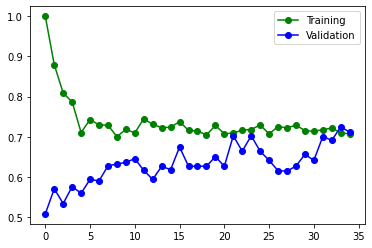

In [21]:
# Applying all n_neighbours values upto 35
k = 35
i = 1
prec_val = []
prec_train = []
while i<=k:
    titanic_model = KNeighborsClassifier(n_neighbors = i)
    titanic_model.fit(X_train, y_train)
    pred = titanic_model.predict(X_val)
    prec_val.append(classification_report(y_val, pred, output_dict = True)['macro avg']['precision'])
    pred = titanic_model.predict(X_train)
    prec_train.append(classification_report(y_train, pred, output_dict = True)['macro avg']['precision'])
    i+=1
    

plt.plot([i for i in range(k)], prec_train, 'go-', label = 'Training')
plt.plot([i for i in range(k)], prec_val, 'bo-', label = 'Validation')
plt.legend()

# Decision Tree Classification

In [22]:
from sklearn.tree import DecisionTreeClassifier
max_leaf_nodes = 5
titanic_model = DecisionTreeClassifier(max_leaf_nodes = max_leaf_nodes)
titanic_model.fit(X_train, y_train)
titanic_model_decision_tree = titanic_model #Saving for later
pred_val = titanic_model.predict(X_val)

In [23]:
print(classification_report(y_val, pred_val))
print(confusion_matrix(y_val, pred_val))

              precision    recall  f1-score   support

           0       0.83      0.86      0.84       127
           1       0.68      0.63      0.66        60

    accuracy                           0.79       187
   macro avg       0.76      0.75      0.75       187
weighted avg       0.78      0.79      0.78       187

[[109  18]
 [ 22  38]]


In [24]:
titanic_model.fit(X_train, y_train)
print(classification_report(y_train, titanic_model.predict(X_train)))
print(confusion_matrix(y_train, titanic_model.predict(X_train)))

              precision    recall  f1-score   support

           0       0.84      0.91      0.87       268
           1       0.83      0.71      0.77       168

    accuracy                           0.83       436
   macro avg       0.83      0.81      0.82       436
weighted avg       0.83      0.83      0.83       436

[[243  25]
 [ 48 120]]


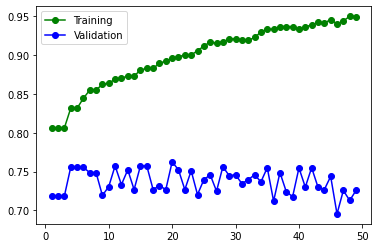

In [25]:
# Applying all max_leaf_nodes values upto 50
k = 50
i = 2
prec_val = []
prec_train = []
while i<=k:
    titanic_model = DecisionTreeClassifier(max_leaf_nodes = i)
    titanic_model.fit(X_train, y_train)
    pred = titanic_model.predict(X_val)
    prec_val.append(classification_report(y_val, pred, output_dict = True)['macro avg']['precision'])
    pred = titanic_model.predict(X_train)
    prec_train.append(classification_report(y_train, pred, output_dict = True)['macro avg']['precision'])
    i+=1
    

plt.plot([i for i in range(1,k)], prec_train, 'go-', label = 'Training')
plt.plot([i for i in range(1,k)], prec_val, 'bo-', label = 'Validation')
plt.legend()

## Hence Decision Tree is a better model

In [50]:
titanic_model = DecisionTreeClassifier(max_leaf_nodes = 5)
titanic_model.fit(X_t, y_t)
pred = titanic_model.predict(X_test)
mae = mean_absolute_error(y_test, pred)
print("MAE = {}\n".format(mae))
print("Classification report:\n {}\n".format(classification_report(y_test,pred)))
print("Confusion Matrix:\n {}\n".format(confusion_matrix(y_test,pred)))

MAE = 0.20522388059701493

Classification report:
               precision    recall  f1-score   support

           0       0.78      0.89      0.83       154
           1       0.82      0.67      0.73       114

    accuracy                           0.79       268
   macro avg       0.80      0.78      0.78       268
weighted avg       0.80      0.79      0.79       268


Confusion Matrix:
 [[137  17]
 [ 38  76]]

